# StarPhotometryFactory

- creation date : 27 juin 2019
- update : 2 July 2019
- author Sylvie Dagoret


Create the calculation for photometry

# Initialisation

In [328]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Import libraries

In [329]:
import matplotlib.pyplot as plt
%matplotlib inline

import datetime

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import matplotlib.dates as mdates
from matplotlib import gridspec

import numpy as np
import pandas as pd

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from scipy.interpolate import interp1d



import math as m

In [330]:
import os
from os import listdir
from os.path import isfile, join
import re
import sys

if not 'workbookDir' in globals():
    workbookDir = os.getcwd()
print('workbookDir: ' + workbookDir)

spectractordir=workbookDir+"/../../Spectractor"
print('spectractordir: ' + spectractordir)
toolsdir=workbookDir+"/../common_tools"
print("toolsdir:",toolsdir)


sys.path.append(workbookDir)
sys.path.append(spectractordir)
sys.path.append(os.path.dirname(workbookDir))
sys.path.append(toolsdir)

workbookDir: /Users/dagoret/MacOSX/GitHub/LSST/SpectractorAnaAtm19/ana_20190214_HD116405_Filtre_None
spectractordir: /Users/dagoret/MacOSX/GitHub/LSST/SpectractorAnaAtm19/ana_20190214_HD116405_Filtre_None/../../Spectractor
toolsdir: /Users/dagoret/MacOSX/GitHub/LSST/SpectractorAnaAtm19/ana_20190214_HD116405_Filtre_None/../common_tools


In [331]:
from astropy.table import Table
from astropy.table import table
from astropy.time import Time
import astropy

In [332]:
plt.rcParams["axes.labelsize"]="large"
plt.rcParams["axes.linewidth"]=2.0
plt.rcParams["xtick.major.size"]=8
plt.rcParams["ytick.major.size"]=8
plt.rcParams["ytick.minor.size"]=5
plt.rcParams["xtick.labelsize"]="large"
plt.rcParams["ytick.labelsize"]="large"

plt.rcParams["figure.figsize"]=(10,10)
plt.rcParams['axes.titlesize'] = 16
plt.rcParams['axes.titleweight'] = 'bold'
#plt.rcParams['axes.facecolor'] = 'blue'
plt.rcParams['xtick.direction'] = 'out'
plt.rcParams['ytick.direction'] = 'out'
plt.rcParams['lines.markeredgewidth'] = 0.3 # the line width around the marker symbol
plt.rcParams['lines.markersize'] = 5  # markersize, in points
plt.rcParams['grid.alpha'] = 0.75 # transparency, between 0.0 and 1.0
plt.rcParams['grid.linestyle'] = '-' # simple line
plt.rcParams['grid.linewidth'] = 0.4 # in points
plt.rcParams['font.size'] = 13

In [333]:
from spectractor import parameters
from spectractor.extractor.extractor import Spectractor
from spectractor.logbook import LogBook
from spectractor.extractor.dispersers import *
from spectractor.extractor.spectrum import *
from spectractor.tools import ensure_dir

from libatmscattering import *


from astropy.table import Table,QTable
from astropy.io import ascii

# PhotUtil
from astropy.stats import sigma_clipped_stats

from photutils import aperture_photometry
from photutils import CircularAperture, CircularAnnulus
from astropy.visualization.mpl_normalize import (ImageNormalize,MinMaxInterval, SqrtStretch)

from photutils import DAOStarFinder


from photutils import make_source_mask
from astropy.stats import SigmaClip

## Define functions

In [334]:

######### CONFIGURATION

## wavelength
WLMIN = 380.0
WLMAX = 1000.0
#NBWLBIN = 62
NBWLBIN = 124
WLBINWIDTH = (WLMAX - WLMIN) / float(NBWLBIN)

WLMINBIN = np.arange(WLMIN, WLMAX, WLBINWIDTH)
WLMAXBIN = np.arange(WLMIN + WLBINWIDTH, WLMAX + WLBINWIDTH, WLBINWIDTH)
WLMEANBIN=(WLMINBIN + WLMAXBIN)/2.

print('WLMINBIN..................................=', WLMINBIN.shape, WLMINBIN)
print('WLMAXBIN..................................=', WLMAXBIN.shape, WLMAXBIN)
print('NBWLBIN...................................=', NBWLBIN)
print('WLBINWIDTH................................=', WLBINWIDTH)

WLMINBIN..................................= (124,) [380. 385. 390. 395. 400. 405. 410. 415. 420. 425. 430. 435. 440. 445.
 450. 455. 460. 465. 470. 475. 480. 485. 490. 495. 500. 505. 510. 515.
 520. 525. 530. 535. 540. 545. 550. 555. 560. 565. 570. 575. 580. 585.
 590. 595. 600. 605. 610. 615. 620. 625. 630. 635. 640. 645. 650. 655.
 660. 665. 670. 675. 680. 685. 690. 695. 700. 705. 710. 715. 720. 725.
 730. 735. 740. 745. 750. 755. 760. 765. 770. 775. 780. 785. 790. 795.
 800. 805. 810. 815. 820. 825. 830. 835. 840. 845. 850. 855. 860. 865.
 870. 875. 880. 885. 890. 895. 900. 905. 910. 915. 920. 925. 930. 935.
 940. 945. 950. 955. 960. 965. 970. 975. 980. 985. 990. 995.]
WLMAXBIN..................................= (124,) [ 385.  390.  395.  400.  405.  410.  415.  420.  425.  430.  435.  440.
  445.  450.  455.  460.  465.  470.  475.  480.  485.  490.  495.  500.
  505.  510.  515.  520.  525.  530.  535.  540.  545.  550.  555.  560.
  565.  570.  575.  580.  585.  590.  595.  600. 

In [335]:
## colors

# wavelength bin colors
jet = plt.get_cmap('jet')
cNorm = colors.Normalize(vmin=0, vmax=NBWLBIN)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors = scalarMap.to_rgba(np.arange(NBWLBIN), alpha=1)

In [336]:
#---------------------------------------------------------------------
def GetWLBin(wl):
    """

    :param wl: wavelength scalar
    :return: index
    """

    set_ibin = np.where(np.logical_and(WLMINBIN <= wl, WLMAXBIN > wl))[0]

    if len(set_ibin)==1:
        return set_ibin[0]
    else:
        return -1
#---------------------------------------------------------------------
def GETWLLabels():

    all_labels=[]
    for idx in np.arange(NBWLBIN):
        label="$\lambda$ : {:3.0f}-{:3.0f} nm".format(WLMINBIN[idx], WLMAXBIN[idx])
        all_labels.append(label)
    all_labels=np.array(all_labels)
    return all_labels
#------------------------------------------------------------------------

WLLABELS=GETWLLabels()

In [337]:
def weighted_avg_and_std(values, weights):
    """
    Return the weighted average and standard deviation.

    values, weights -- Numpy ndarrays with the same shape.

    For example for the PSF

    x=pixel number
    y=Intensity in pixel

    values-x
    weights=y=f(x)

    """
    weights=np.where(weights>0,weights,0)
    average = np.average(values, weights=weights)
    variance = np.average((values - average) ** 2, weights=weights)  # Fast and numerically precise
    return average, np.sqrt(variance)

In [338]:
#-------------------------------------------------------------------------------------
def GetAllFiles(dir):
    """
    GetAllFiles(dir): provides the list of relevant files inside the directory dir


    :param dir: input directory pathname
    :return: list of files
    """

    # get all files
    onlyfiles = [f for f in listdir(dir) if isfile(join(dir, f))]
    onlyfiles = np.array(onlyfiles)

    # sort files
    sortedindexes = np.argsort(onlyfiles)
    onlyfiles = onlyfiles[sortedindexes]

    # get only _spectrum.fits file
    onlyfilesspectrum = []
    for file_name in onlyfiles:
        if re.search("^T.*_spectrum.fits$", file_name):
            # check if other files exits

            filetype = file_name.split('.')[-1]

            output_filename = os.path.basename(file_name)
            output_filename = os.path.join(dir, output_filename)
            output_filename_spectrogram = output_filename.replace('spectrum', 'spectrogram')
            output_filename_psf = output_filename.replace('spectrum.fits', 'table.csv')

            # go to next simulation if output files already exists
            if os.path.isfile(output_filename) and os.path.isfile(output_filename_spectrogram) and os.path.isfile(
                    output_filename_psf):
                filesize = os.stat(output_filename).st_size
                print(">>>>> output filename : {} already exists with size {} ".format(output_filename, filesize))

                filesize = os.stat(output_filename_spectrogram).st_size
                print(">>>>> output filename : {} already exists with size {} ".format(output_filename_spectrogram,
                                                                                       filesize))
                filesize = os.stat(output_filename_psf).st_size
                print(">>>>> output filename : {} already exists with size {} ".format(output_filename_psf, filesize))

                onlyfilesspectrum.append(re.findall("(^T.*_spectrum.fits$)", file_name)[0])

    # sort again all the files
    onlyfilesspectrum = np.array(onlyfilesspectrum)
    sortedindexes = np.argsort(onlyfilesspectrum)
    onlyfilesspectrum = onlyfilesspectrum[sortedindexes]

    # get basnemae of files for later use (to check if _table.csv and _spectrogram.fits exists
    onlyfilesbasename = []
    for f in onlyfilesspectrum:
        onlyfilesbasename.append(re.findall("(^T.*)_spectrum.fits$", f)[0])


    return onlyfilesspectrum,onlyfilesbasename
#------------------------------------------------------------------------------------------------------------------------------


In [339]:
def ReadAllFiles(dir, filelist):
    """

    ReadAllFiles(dir, filelist): Read all files

    :param dir: input directory
    :param filelist: list fo files
    :return: various containers
    """


    # init all container
    all_indexes=[]   # continuous index
    all_eventnum=[]  # event number on filename

    all_airmass=[]   #airmass

    all_lambdas = [] # wavelength

    #fluxes
    all_flux=[]
    all_errflux=[]


    # magnitudes
    all_mag=[]
    all_errmag=[]

    # absorption (Magnitude corrected from Rayleigh
    all_abs=[]
    all_errabs=[]


    all_dt       = []   # time since beginning in hours
    all_datetime = []   # datetime
    all_T=[]   # astropy time

    # preselection flag
    all_flag = []


    #bad indexes and filename
    all_badidx=[]
    all_badfn=[]


    all_BGimg=[]  # Background
    all_Rawimg = []  # Raw deflatted image
    
    all_fn= []

    NBSPEC = len(filelist)


    #----------------------------------
    # Extract spectra information from files
    # compute magnitudes
    #-----------------------------

    count=-1  #counter of good files before filtering

    # loop on all files
    for idx in np.arange(0, NBSPEC):
        if idx==322:
            print("SKIP bad file",filelist[idx] )
            continue

        count+=1

        theeventnum = int(filelist[idx].split(".")[1].split("_")[0])


        #print(" read {}) : event {} , file {}".format(idx,theeventnum,filelist[idx]))


        fullfilename = os.path.join(dir, filelist[idx])
        fullfilename_spectrogram = fullfilename.replace('spectrum', 'spectrogram')
        rawfilename = filelist[idx].replace('_spectrum.fits', '.fit')
        fillrawfilename = os.path.join(rawinput_directory, rawfilename)



        #try:
        if 1:
            # read fits file
            hdu = fits.open(fullfilename)
            hdu2=fits.open(fullfilename_spectrogram)
            hdu3 = fits.open(fillrawfilename)





            # decode header
            header=hdu[0].header

            am=header["AIRMASS"]
            date=header["DATE-OBS"]

            # Astropy T0 time
            if idx==0:
                T0= Time(date, format='isot', scale='utc')

            # Astropy T time
            T=Time(date, format='isot', scale='utc')


            #datetime
            thedatetime=T.to_datetime()

            DT=(T-T0).sec/(3600.0)  # convert in hours


            # decode data
            data=hdu[0].data

            # extract wavelength, spectrum and errors
            wavelength=data[0,:]
            spec = data[1,:]
            err=data[2,: ]

            if(len(wavelength)==0 or len(spec)==0 or len(err)==0):
                print(">>>>>>>>>>>>>>  Empty file ",idx,")::",onlyfilesspectrum[idx] )
                print(">>>>>>>>>>>>>>>>>>>>>>>>>>>",len(wavelength)," , ",len(spec0), " , ",len(err))



            # sort the wavelengths
            wl_sorted_idx=np.argsort(wavelength)

            wl=wavelength[wl_sorted_idx]
            fl=spec[wl_sorted_idx]
            errfl=err[wl_sorted_idx]
            wlbins = [GetWLBin(w) for w in wl]
            wlbins = np.array(wlbins)


            # defines good measurmements as flux >0 and wavelength in selected bons
            goodpoints=np.where(np.logical_and(fl != 0, wlbins != -1))

            if(len(goodpoints)==0):
                print(">>>>>>>>>>>>>>  No Good points  ", idx, ")::", onlyfilesspectrum[idx])
                print(">>>>>>>>>>>>>>  No Good points  ", "wl = ",wl)
                print(">>>>>>>>>>>>>>  No Good points  ", "fl = ", fl)
                print(">>>>>>>>>>>>>>  No Good points  ", "errfl = ", errfl)



            # keep good points (wl,flux)
            wl=wl[goodpoints]
            fl=fl[goodpoints]
            errfl=errfl[goodpoints]


            # convert flux into magnitudes for each wavelength
            mag = -2.5 * np.log10(fl)
            errmag = errfl/fl

            #compute effective slant Rayleigh optical depth (not the vertical optical depth)
            od_adiab = RayOptDepth_adiabatic(wl,altitude=2890.5, costh=1./am)  # Rayleigh optical depth

            # absorption magnitude corrected from Rayleigh attenuation
            abs=mag-2.5/np.log(10.)*od_adiab
            errabs=errmag


            # save for each observation  { event-id, airmass, set of points (wl,flux,errflux, mag,abs,errabs) }
            if(len(mag>0)):
                #all_indexes.append(idx)
                all_indexes.append(count)
                all_eventnum.append(theeventnum)
                all_airmass.append(am)
                all_lambdas.append(wl)
                all_flux.append(fl)
                all_errflux.append(errfl)
                all_mag.append(mag)
                all_errmag.append(errmag)
                all_abs.append(abs)
                all_errabs.append(errabs)
                all_dt.append(DT)
                all_datetime.append(thedatetime)
                all_T.append(T)
                all_BGimg.append(hdu2[2].data)
                all_Rawimg.append(hdu3[0].data)
                all_fn.append(fillrawfilename)

                absmin = abs.min()
                absmax = abs.max()


                # Set a quality flag
                if absmin < 25 or absmax > 32:
                    print("file index idx = ", count, "==>  filename = ", onlyfilesspectrum[idx], " absmin= ", absmin,
                          " absmax = ", absmax)
                    all_flag.append(False)
                    all_badidx.append(count)
                    all_badfn.append(onlyfilesspectrum[idx])
                else:
                    all_flag.append(True)



        #except:
        if 0:
            print("Unexpected error:", sys.exc_info()[0])
            pass

        #if count>10:
        #    break

    # transform container in numpy arrays
    all_indexes=np.array(all_indexes)
    all_eventnum = np.array(all_eventnum)

    all_airmass = np.array(all_airmass)

    all_lambdas = np.array(all_lambdas)

    all_flux = np.array(all_flux)
    all_errflux = np.array(all_errflux)


    all_mag=np.array(all_mag)
    all_errmag=np.array(all_errmag)

    all_abs = np.array(all_abs)
    all_errabs = np.array(all_errabs)

    all_dt = np.array(all_dt)
    all_datetime=np.array(all_datetime)

    all_flag = np.array(all_flag)

    all_badidx=np.array(all_badidx)
    all_badfn=np.array(all_badfn)


    return all_indexes,all_eventnum,all_airmass,all_lambdas,all_flux,all_errflux,all_mag,all_errmag,all_abs,all_errabs,all_dt,all_datetime,all_T,all_flag,all_badidx,all_badfn, all_BGimg,all_Rawimg,all_fn

In [340]:
def FindSources(index,data,thresfact=50,fwhm=10.0):
    """
    """
    
    if index in [16,19] or index in np.arange(27,35):
        data[:500,:500]=0
        thres=5.
        fwhm=20.0
        
        
    
    mean, median, std = sigma_clipped_stats(data, sigma=3.0)
    daofind = DAOStarFinder(fwhm=fwhm, threshold=thresfact*std)    
    sources = daofind(data - median) 
    #sources = daofind(data) 
    return sources

In [341]:
r_star=25
r_in_bkg=40
r_out_bkg=50

In [342]:
def ComputePhotometry(vignette,x0,y0):
    gel=4.8 # electrons per ADU
    
    star_aperture= CircularAperture((x0,y0), r=r_star)
    
    theannulus_aperture = CircularAnnulus((x0,y0), r_in=r_in_bkg, r_out=r_out_bkg)
    theannulus_masks = theannulus_aperture.to_mask(method='center')
    theannulus_data = theannulus_masks[0].multiply(vignette)  # the annulus data image
    themask = theannulus_masks[0].data
    theannulus_data_1d = theannulus_data[themask > 0]
    _, themedian_sigclip, _ = sigma_clipped_stats(theannulus_data_1d)
    print("themedian_sigclip=",themedian_sigclip)
    thefullbg = np.full_like(theannulus_data, themedian_sigclip)
 
    thebg=theannulus_masks[0]*thefullbg

    theerror = np.sqrt(vignette/gel) # should be better calculated
    phot = aperture_photometry(vignette, star_aperture,error=theerror)
    phot['annulus_median'] = themedian_sigclip
    phot['aper_bkg'] = themedian_sigclip * star_aperture.area()
    phot['aper_sum_bkgsub'] = phot['aperture_sum'] - phot['aper_bkg']
    for col in phot.colnames:
        phot[col].info.format = '%.5g'  # for consistent table output
    print(phot)
    
    return phot

In [343]:
left  = 0  # the left side of the subplots of the figure
right = 0.99    # the right side of the subplots of the figure
bottom = 0.01   # the bottom of the subplots of the figure
top = 0.99      # the top of the subplots of the figure
wspace = 0   # the amount of width reserved for space between subplots,
               # expressed as a fraction of the average axis width
hspace = 0.2   # the amount of height reserved for space between subplots,
               # expressed as a fraction of the average axis height
plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)

<Figure size 720x720 with 0 Axes>

In [344]:
def ShowImages(all_images,all_titles,figfilename='input_images.pdf'):
    """
    ShowRawImages: Show the raw images without background subtraction
    ==============
    """
    #global all_images
    #global all_titles
    #global object_name

    NBIMGPERLROW=4
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,int(m.ceil(float(NBIMAGES)/float(NBIMGPERLROW))))

   
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(20,5*MAXIMGROW))
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    for index in np.arange(0,NBIMAGES):
        ix=int(index%NBIMGPERLROW)
        iy=int(index/NBIMGPERLROW)
        norm = ImageNormalize(all_images[index], interval=MinMaxInterval(),stretch=SqrtStretch())
        im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',norm=norm)
        thetitle="idx={}):".format(index)+all_titles[index]
        axarr[iy,ix].set_title(thetitle)
        axarr[iy,ix].grid(color='white', ls='solid')
        #axarr[iy,ix].text(1000.,1700,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        axarr[iy,ix].grid(color='white', ls='solid')
    #title='Raw images of {}'.format(object_name)
    #plt.suptitle(title,size=16)    
    figfilename=os.path.join(outputdir,figfilename)
    plt.savefig(figfilename)  

In [345]:
def ShowHisto(all_histos,all_titles,all_idx,figfilename='hist_bkgres.pdf'):
    """
    ShowHisto: Show histo of images without background subtraction
    ==============
    """
    
    NBIMGPERLROW=4
    NBHISTOS=len(all_histos)
    MAXIMGROW=max(2,int(m.ceil(float(NBHISTOS)/float(NBIMGPERLROW))))

   
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(20,5*MAXIMGROW))
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    for index in np.arange(0,NBHISTOS):
        ix=int(index%NBIMGPERLROW)
        iy=int(index/NBIMGPERLROW)
        histo=all_histos[index]
        mean=histo.mean()
        std=histo.std()
        hmin=histo.min()
        hmax=histo.max()
        N=len(histo)
        #print("idx=",all_idx[index]," mean = ",mean," std = ",std,' min = ',hmin, ' max = ',hmax," N = ",N)

        axarr[iy,ix].hist(histo,bins=50,range=(-200,200));
        thetitle="idx={}):".format(all_idx[index])+all_titles[index]
        axarr[iy,ix].set_title(thetitle)   
        axarr[iy,ix].grid(color='k', ls='solid')
    
    figfilename=os.path.join(outputdir,figfilename)
    plt.savefig(figfilename)

In [346]:
def ShowProfile(all_profile1,all_profile2,all_titles,all_idx,X10,X20,figfilename='prof_XY.pdf'):
    """
    ShowHisto: Show histo of images without background subtraction
    ==============
    """
    
    NBIMGPERLROW=4
    NBHISTOS=len(all_profile1)
    MAXIMGROW=max(2,int(m.ceil(float(NBHISTOS)/float(NBIMGPERLROW))))

   
    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(20,5*MAXIMGROW))
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    for index in np.arange(0,NBHISTOS):
        ix=int(index%NBIMGPERLROW)
        iy=int(index/NBIMGPERLROW)
        prof1=all_profile1[index]
        prof2=all_profile2[index]
        X1=np.arange(len(prof1))-X10
        X2=np.arange(len(prof2))-X20
        axarr[iy,ix].plot(X1,prof1,"r-o")
        axarr[iy,ix].plot(X2,prof2,"b-o")
        axarr[iy,ix].set_xlim(-50,50)
        thetitle="idx={}):".format(all_idx[index])+all_titles[index]
        axarr[iy,ix].set_title(thetitle)   
        axarr[iy,ix].grid(color='k', ls='solid')
    
    figfilename=os.path.join(outputdir,figfilename)
    plt.savefig(figfilename)

In [347]:
def ShowSources(all_images,all_titles,all_sources,figfilename='sources_images.pdf'):
    """
    ShowSources: Show the raw images and aperture
    ==============
    
    output :
        all_idx : all indexes   
        all_x0=[] : x0 coordinate of little star
        all_y0=[] : y0 coordinate of little star
    
    """
    #global all_images
    #global all_titles
    #global object_name

    NBIMGPERLROW=4
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,int(m.ceil(float(NBIMAGES)/float(NBIMGPERLROW))))

    # output containers
    all_idx = []   
    all_x0=[]
    all_y0=[]

    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(20,5*MAXIMGROW))
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    for index in np.arange(0,NBIMAGES):
        ix=int(index%NBIMGPERLROW)
        iy=int(index/NBIMGPERLROW)
        norm = ImageNormalize(all_images[index], interval=MinMaxInterval(),stretch=SqrtStretch())
        im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',norm=norm)
        thetitle="idx={}):".format(index)+all_titles[index]
        axarr[iy,ix].set_title(thetitle)
        axarr[iy,ix].grid(color='white', ls='solid')
        #axarr[iy,ix].text(1000.,1700,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        axarr[iy,ix].grid(color='white', ls='solid')
        
        all_idx.append(index)
        # this may depends on index
        
        # exclude misssing star
        if index in np.arange(47,72+1) or index in np.arange(96,102+1) or index in np.arange(111,117+1) or index in np.arange(253,254+1) or index in np.arange(316,317+1):          
            all_x0.append(0)
            all_y0.append(0)
            continue
        
        
        # try
        thesource=all_sources[index]
        
        if len(thesource)!= 0:
            if len(thesource)>=2:
                all_x=thesource["xcentroid"]
                all_y=thesource["ycentroid"]       
        
                pidx=np.where(all_y==all_y.min())[0][0]
       
                x0=all_x[pidx]
                y0=all_y[pidx]
                
            else:
                pidx=0
                x0=thesource["xcentroid"][0]
                y0=thesource["ycentroid"][0]
        
            all_x0.append(x0)
            all_y0.append(y0)
        
            if x0!=0 and y0!=0 :
                star_aperture= CircularAperture((x0,y0), r=r_star)
                theannulus_aperture = CircularAnnulus((x0,y0), r_in=r_in_bkg, r_out=r_out_bkg)
        
                star_aperture.plot(color="red",lw=2,ax=axarr[iy,ix])
                theannulus_aperture.plot(color="yellow",lw=2,ax=axarr[iy,ix])
            
        else: # no source found
            if index in np.arange(27,35):
                
                thex9=[600,620,630,660,565,575,595,630]
                they9=[70,72,72,72,110,97,95,90,85]
            
                x0=thex9[index-27]
                y0=they9[index-27]
          
                all_x0.append(x0)
                all_y0.append(y0)
                
                star_aperture= CircularAperture((x0,y0), r=r_star)
                theannulus_aperture = CircularAnnulus((x0,y0), r_in=r_in_bkg, r_out=r_out_bkg)
        
                star_aperture.plot(color="red",lw=2,ax=axarr[iy,ix])
                theannulus_aperture.plot(color="yellow",lw=2,ax=axarr[iy,ix])
                
                
            else:
                all_x0.append(0)
                all_y0.append(0)
        
    #title='Raw images of {}'.format(object_name)
    #plt.suptitle(title,size=16)    
    figfilename=os.path.join(outputdir,figfilename)
    plt.savefig(figfilename)
    all_idx=np.array(all_idx)
    all_x0=np.array(all_x0)
    all_y0=np.array(all_y0)
    return all_idx,all_x0,all_y0

In [348]:
def ShowAperture_SquareImage(all_images,all_titles,all_idx,X0,Y0,normflag=False,figfilename='photometry_apertures.pdf'):
    """
    ShowAperture_SquareImage: Show the star and apertures
    ==============
    
    
    
    """
    
    NBIMGPERLROW=4
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,int(m.ceil(float(NBIMAGES)/float(NBIMGPERLROW))))



    f, axarr = plt.subplots(MAXIMGROW,NBIMGPERLROW,figsize=(20,5*MAXIMGROW))
    plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=wspace, hspace=hspace)
    for index in np.arange(0,NBIMAGES):
        ix=int(index%NBIMGPERLROW)
        iy=int(index/NBIMGPERLROW)
        norm = ImageNormalize(all_images[index], interval=MinMaxInterval(),stretch=SqrtStretch())
        if normflag:
            im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow',norm=norm)
        else:
            im=axarr[iy,ix].imshow(all_images[index],origin='lower',cmap='rainbow')
        thetitle="idx={}):".format(all_idx[index])+all_titles[index]
        axarr[iy,ix].set_title(thetitle)
        axarr[iy,ix].grid(color='white', ls='solid')
        #axarr[iy,ix].text(1000.,1700,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        axarr[iy,ix].grid(color='white', ls='solid')
        
     
        

        star_aperture= CircularAperture((X0,Y0), r=r_star)
        theannulus_aperture = CircularAnnulus((X0,Y0), r_in=r_in_bkg, r_out=r_out_bkg)
        
        star_aperture.plot(color="red",lw=2,ax=axarr[iy,ix])
        theannulus_aperture.plot(color="yellow",lw=2,ax=axarr[iy,ix])
            

        
    #title='Raw images of {}'.format(object_name)
    #plt.suptitle(title,size=16)    
    figfilename=os.path.join(outputdir,figfilename)
    plt.savefig(figfilename)
    

# Configuration

## Flag

In [349]:
FLAG_ShowImages=False  # show the raw reduced image before any task
FLAG_SearchPos=False    # True : Sear the little star and save (x0,y0) in an astropy table
                       # False : Load the table of (x0,y0)
FLAG_DebugSearchPos=False  # Debug Search position on a single image

In [350]:
FLAG_StarImagePadding=True

## Input

In [351]:
# where are the spectra
#----------------------
thedate = "20190214"
#input_directory = "/Users/dagoret/DATA/PicDuMidiFev2019/spectractor_output_prod3/" + thedate
input_directory = "/Users/dagoret/DATA/PicDuMidiFev2019/spectractor_output_prod4/" + thedate
rawinput_directory="/Users/dagoret/DATA/PicDuMidiFev2019/prod_"+thedate+"_v4"


In [352]:
logbook= "simple_logbook_PicDuMidi_20190214_v4_filter_None_marcsel_july19.csv"

## Output

In [353]:
outputdir="out_starphotometryfactory"

In [354]:
ensure_dir(outputdir)

In [355]:
# output table containing little star coordinate
outputfilenamepostable="table_sourceposition.ecsv"

In [356]:
# output table containing star photometry
outputfilenamestarphotometry="table_starphotometry.ecsv"

In [357]:
fullfilenamepostable=os.path.join(outputdir,outputfilenamepostable)

In [358]:
fullfilenamestarphotometry=os.path.join(outputdir,outputfilenamestarphotometry)

## Parameters

In [359]:
gel=4.8 # electrons per ADU

## Star padding

In [360]:
guard_ring_height=100

# Main

## Get list of files

In [361]:
input_directory

'/Users/dagoret/DATA/PicDuMidiFev2019/spectractor_output_prod4/20190214'

In [362]:
df_lb=pd.read_csv(logbook)

In [363]:
ListOfFiles=df_lb["file"].values

In [364]:
#onlyfilesspectrum,onlyfilesbasename=GetAllFiles(input_directory)

In [365]:
basenamecut=[]
for f in ListOfFiles:
    basenamecut.append(f.split("_HD")[0])

## Read fits files

In [366]:
#NBSPEC = len(onlyfilesspectrum)
#print('NBSPEC....................................= ', NBSPEC)
#all_indexes, all_eventnum, all_airmass, all_lambdas, all_flux, all_errflux, all_mag, all_errmag, all_abs, all_errabs, all_dt, all_datetime, all_T,all_flag, all_badidx, all_badfn, all_BGimg,all_Rawimg,all_fn=\
#        ReadAllFiles(input_directory, onlyfilesspectrum)

In [367]:
def SimpleReadAllFiles(dir, filelist,df):
    """

    SimpleReadAllFiles(dir, filelist): Read all files

    :param dir: input directory
    :param filelist: list fo files
    :return: various containers
    """


    # init all container
    all_indexes=[]   # continuous index
    all_eventnum=[]  # event number on filename

    all_airmass=[]   #airmass

    all_lambdas = [] # wavelength

    #fluxes
    all_flux=[]
    all_errflux=[]


    # magnitudes
    all_mag=[]
    all_errmag=[]

    # absorption (Magnitude corrected from Rayleigh
    all_abs=[]
    all_errabs=[]


    all_dt       = []   # time since beginning in hours
    all_datetime = []   # datetime
    all_T=[]   # astropy time

    # preselection flag
    all_flag = []


    #bad indexes and filename
    all_badidx=[]
    all_badfn=[]


    all_BGimg=[]  # Background
    all_Rawimg = []  # Raw deflatted image
    
    all_fn= []

    NBSPEC = len(filelist)


    #----------------------------------
    # Extract spectra information from files
    # compute magnitudes
    #-----------------------------

    count=-1  #counter of good files before filtering

    # loop on all files
    for idx in np.arange(0, NBSPEC):

        count+=1

        theeventnum = int(filelist[idx].split(".")[1].split("_")[0])


        #print(" read {}) : event {} , file {}".format(idx,theeventnum,filelist[idx]))

        fullfilename = os.path.join(dir, filelist[idx])

        #try:
        if 1:
            # read fits file
            hdu = fits.open(fullfilename)


            # decode header
            header=hdu[0].header

            am=header["AIRMASS"]
            date=header["DATE-OBS"]

            # Astropy T0 time
            if idx==0:
                T0= Time(date, format='isot', scale='utc')

            # Astropy T time
            T=Time(date, format='isot', scale='utc')


            #datetime
            thedatetime=T.to_datetime()

            DT=(T-T0).sec/(3600.0)  # convert in hours


            # decode data
            data=hdu[0].data



            all_indexes.append(count)
            all_eventnum.append(theeventnum)

            all_airmass.append(am)

            all_dt.append(DT)
            all_datetime.append(thedatetime)
            all_T.append(T)
 
            all_Rawimg.append(hdu[0].data)
            all_fn.append(filelist[idx])

 

        #except:
        if 0:
            print("Unexpected error:", sys.exc_info()[0])
            pass

        #if count>10:
        #    break

    # transform container in numpy arrays
    all_indexes=np.array(all_indexes)
    all_eventnum = np.array(all_eventnum)

    all_airmass = np.array(all_airmass)


    all_dt = np.array(all_dt)
    all_datetime=np.array(all_datetime)

    return all_indexes,all_eventnum,all_airmass,all_dt,all_datetime,all_T,all_Rawimg,all_fn

In [368]:
all_indexes, all_eventnum, all_airmass, all_dt, all_datetime, all_T,all_Rawimg,all_fn=\
        SimpleReadAllFiles(rawinput_directory, ListOfFiles,df_lb)

# Precut the image

In [369]:
all_vignettes=[img[0:1200,0:1200] for img in all_Rawimg]

In [370]:
if FLAG_ShowImages:
    ShowImages(all_vignettes,basenamecut)

In [371]:
NBIMAGES=len(all_Rawimg)

In [372]:
print("NB_IMAGES=",NBIMAGES)

NB_IMAGES= 35


# Partie 1 :  Search the little star

In [373]:
#all_sources = [ FindSources(img,thresfact=100.,fwhm=10.) for img in all_vignettes]

In [374]:
if FLAG_SearchPos:
    all_sources = []
    index=0

    for img in all_vignettes:
        sources=FindSources(index,np.copy(img),thresfact=100.,fwhm=10.) 
        all_sources.append(sources)
        index+=1

## debug

In [375]:
if FLAG_DebugSearchPos:
    selnum=30
    selectedvignette=all_vignettes[selnum]
    norm = ImageNormalize(selectedvignette, interval=MinMaxInterval(),stretch=SqrtStretch())
    #sources=FindSources(selnum,np.copy(selectedvignette),thresfact=1,fwhm=100)

In [376]:
if FLAG_DebugSearchPos:
    sources

In [377]:
if FLAG_DebugSearchPos:
    if len(sources) >0:
        x0=sources["xcentroid"][0]
        y0=sources["ycentroid"][0]

In [378]:
if FLAG_DebugSearchPos:
    plt.imshow(selectedvignette,origin="lower",cmap="jet",norm=norm)
    if len(sources) >0:
        star_aperture=star_aperture= CircularAperture((x0,y0), r=r_star)
        star_aperture.plot(color="r")   
    plt.grid(color="w")
    plt.title(basenamecut[selnum])
    plt.xlim(600,750)
    plt.ylim(70,120)

## Show selected stars

In [379]:
if FLAG_SearchPos:
    all_index,all_x0,all_y0=ShowSources(all_vignettes,basenamecut,all_sources,figfilename="sources_030719.png")

## Save or load the position table

In [380]:
if FLAG_SearchPos:
    # create the table and save it
    t=Table([all_index,all_T, all_airmass,all_x0,all_y0,all_fn],names=('index','date','airmass','x0','y0','file'))
    t.write(fullfilenamepostable,format="ascii.ecsv",overwrite=True)
else:
    t=Table.read(fullfilenamepostable,format="ascii.ecsv")
    all_index=t["index"].data
    all_x0=t["x0"].data
    all_y0=t["y0"].data 
    all_t=t["date"].data

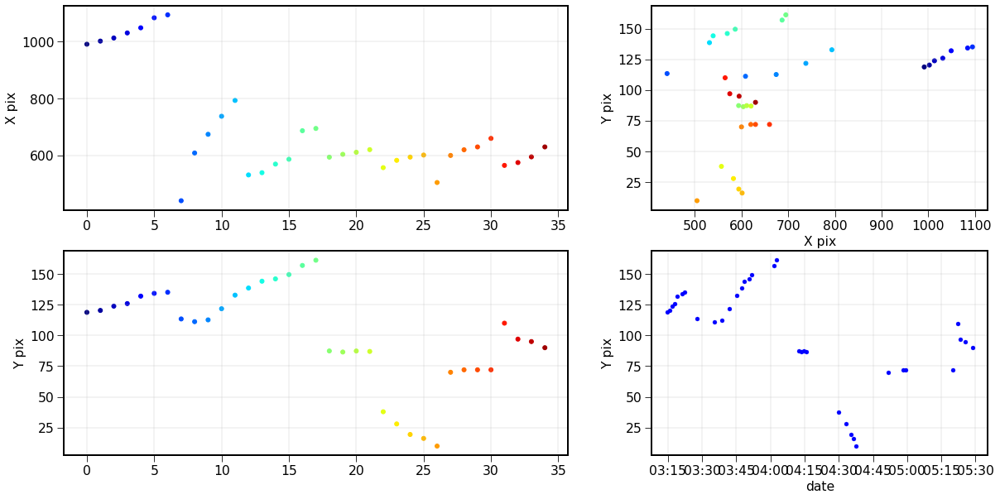

In [381]:
jet = plt.get_cmap('jet')
cNorm = colors.Normalize(vmin=0, vmax=NBIMAGES)
scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=jet)
all_colors = scalarMap.to_rgba(np.arange(NBIMAGES), alpha=1)

plt.figure(figsize=(20,10))
gs = gridspec.GridSpec(2, 2,
                       width_ratios=[3, 2],
                       height_ratios=[1, 1]
                       )
#gs.update(left=0.05, right=0.05, wspace=0.1)

#ax = plt.subplot2grid((2, 2), (0, 0)) # identical to ax = plt.subplot(2, 2, 1)
#ax2 = plt.subplot2grid((3, 3), (1, 0), colspan=2)
#ax3 = plt.subplot2grid((3, 3), (1, 2), rowspan=2)


#fig3 = plt.figure(constrained_layout=True)
#gs = fig3.add_gridspec(3, 3)
#f3_ax1 = fig3.add_subplot(gs[0, :])
#f3_ax1.set_title('gs[0, :]')
#f3_ax2 = fig3.add_subplot(gs[1, :-1])
#f3_ax2.set_title('gs[1, :-1]')
#f3_ax3 = fig3.add_subplot(gs[1:, -1])
#f3_ax3.set_title('gs[1:, -1]')
#f3_ax4 = fig3.add_subplot(gs[-1, 0])
#f3_ax4.set_title('gs[-1, 0]')
#f3_ax5 = fig3.add_subplot(gs[-1, -2])
#f3_ax5.set_title('gs[-1, -2]')

ax1 = plt.subplot(gs[0,0])
ax2 = plt.subplot(gs[:-1,1])
#ax2 =plt.subplot2grid(gs[1,1],rowspan=2)
ax3 = plt.subplot(gs[1,0])
ax4 = plt.subplot(gs[3])

ax1.scatter(all_index,all_x0,marker='o',c=all_colors)
ax1.grid()
ax1.set_ylabel("X pix")
ax3.scatter(all_index,all_y0,marker='o',c=all_colors)
ax3.grid()
ax3.set_ylabel("Y pix")
ax2.scatter(all_x0,all_y0,marker="o",c=all_colors)
ax2.grid()
ax2.set_xlabel("X pix")
ax2.set_ylabel("Y pix")
ax4.plot(all_datetime,all_y0,"bo")
ax4.set_ylabel("Y pix")

#myFmt = mdates.DateFormatter('%d-%H:%M')
#plt.gca().xaxis.set_major_formatter(myFmt)
myFmt = mdates.DateFormatter('%H:%M')
ax4.xaxis.set_major_formatter(myFmt)
    
ax4.set_xlabel("date")
ax4.grid()

# Partie 2 : Photometrie

## Global photometry

In [382]:
selectionfunc = lambda x, y : False if x  == 0 and y==0 else True

In [383]:
FLAG_SEL = [selectionfunc(all_x0[idx],all_y0[idx]) for idx in np.arange(NBIMAGES) ]

In [384]:
Selected_Indexes=all_index[FLAG_SEL]

In [385]:
Selected_Indexes

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34])

In [437]:
all_y0

array([118.81252919, 120.37029859, 123.85382767, 125.94510205,
       132.01212899, 134.25827145, 135.16656426, 113.43988361,
       111.21534465, 112.67372518, 121.76206337, 132.81662268,
       138.62132985, 144.1803293 , 146.07197074, 149.57095362,
       157.01509727, 161.26891663,  87.35615572,  86.49222537,
        87.32819398,  86.97090016,  37.82693148,  27.9107527 ,
        19.33394219,  16.11376731,   9.86226384,  70.        ,
        72.        ,  72.        ,  72.        , 110.        ,
        97.        ,  95.        ,  90.        ])

### New array of the selected obs size

In [386]:
new_basenamecut = [basenamecut[idx] for idx in Selected_Indexes]
new_all_datetime = [all_datetime[idx] for idx in Selected_Indexes]
new_x0 = [all_x0[idx] for idx in Selected_Indexes]
new_y0 = [all_y0[idx] for idx in Selected_Indexes]
new_airmass = [all_airmass[idx] for idx in Selected_Indexes]
new_fn = [all_fn[idx] for idx in Selected_Indexes]
new_T = [all_T[idx] for idx in Selected_Indexes]

### Basic aperture photometry

In [387]:
sel_idx=0

In [388]:
all_annulus_median=np.zeros(NBIMAGES)
all_aper_bkg=np.zeros(NBIMAGES)
all_aper_sum_bkgsub=np.zeros(NBIMAGES)

for idx in Selected_Indexes: 
    phottable=ComputePhotometry(all_vignettes[idx],all_x0[idx],all_y0[idx])
    all_annulus_median[idx]=phottable["annulus_median"]
    all_aper_bkg[idx]=phottable["aper_bkg"]  
    all_aper_sum_bkgsub[idx]=phottable["aper_sum_bkgsub"]

themedian_sigclip= 832.5132264888806
 id xcenter ycenter aperture_sum ... annulus_median  aper_bkg  aper_sum_bkgsub
      pix     pix                ...                                          
--- ------- ------- ------------ ... -------------- ---------- ---------------
  1  991.18  118.81   7.3073e+06 ...         832.51 1.6346e+06      5.6727e+06
themedian_sigclip= 847.1457677722581
 id xcenter ycenter aperture_sum ... annulus_median  aper_bkg  aper_sum_bkgsub
      pix     pix                ...                                          
--- ------- ------- ------------ ... -------------- ---------- ---------------
  1  1002.1  120.37   7.3604e+06 ...         847.15 1.6634e+06       5.697e+06
themedian_sigclip= 854.1046652293908
 id xcenter ycenter aperture_sum ... annulus_median  aper_bkg aper_sum_bkgsub
      pix     pix                ...                                         
--- ------- ------- ------------ ... -------------- --------- ---------------
  1    1013  123.85   7

Text(0, 0.5, 'magnitude (mag)')

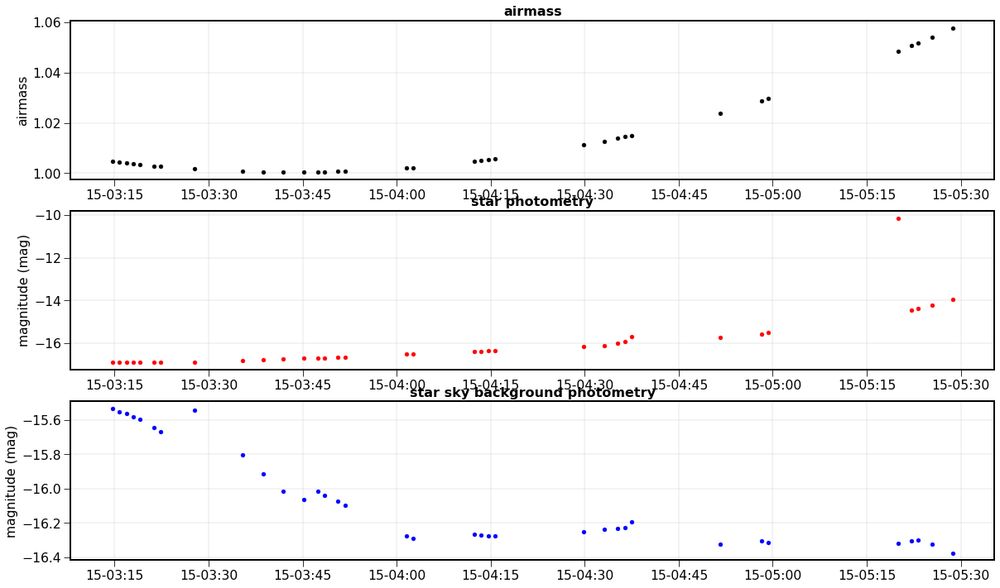

In [389]:
plt.figure(figsize=(20,12))
plt.subplot(3,1,1)
plt.plot(new_all_datetime ,new_airmass,'ko')
plt.ylabel("airmass")
plt.title("airmass")
myFmt = mdates.DateFormatter('%d-%H:%M')
plt.gca().xaxis.set_major_formatter(myFmt)
plt.grid()
plt.subplot(3,1,2)
plt.plot(all_datetime ,-2.5*np.log10(all_aper_sum_bkgsub),'ro')
myFmt = mdates.DateFormatter('%d-%H:%M')
plt.gca().xaxis.set_major_formatter(myFmt)
plt.grid()
#plt.ylim(-16.5,-15.5)
plt.title("star photometry")
plt.ylabel("magnitude (mag)")
plt.subplot(3,1,3)
plt.plot(all_datetime ,-2.5*np.log10(all_aper_bkg),'bo')
myFmt = mdates.DateFormatter('%d-%H:%M')
plt.gca().xaxis.set_major_formatter(myFmt)
plt.grid()
plt.title("star sky background photometry")
#plt.ylim(-16.5,-15.5)
plt.ylabel("magnitude (mag)")

## Star photometry

### The guard ring

In [390]:
NX,NY=all_vignettes[0].shape[1],all_vignettes[0].shape[0]

In [391]:
the_guard_ring=np.zeros((guard_ring_height,NX))

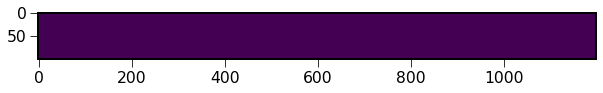

In [392]:
plt.imshow(the_guard_ring)

In [393]:
new_vignettes=[]
if FLAG_StarImagePadding==True:
    for idx in Selected_Indexes: 
        # add the guard-ring at the bottom of the image new size : (NY+the_gard_ring,NX)
        new_big_vignette=np.concatenate((the_guard_ring,all_vignettes[idx]),axis=0)
        # new coordinates of the target star
        new_x0=all_x0[idx]
        new_y0=all_y0[idx]+guard_ring_height
        new_vignette=new_big_vignette[int(new_y0-guard_ring_height):int(new_y0+guard_ring_height),int(new_x0-guard_ring_height):int(new_x0+guard_ring_height)]
        new_vignettes.append(new_vignette)
else:
    for idx in Selected_Indexes: 
        new_x0=all_x0[idx]
        new_y0=all_y0[idx]
        new_vignette=new_big_vignette[int(new_y0-guard_ring_height):int(new_y0+guard_ring_height),int(new_x0-guard_ring_height):int(new_x0+guard_ring_height)]
        new_vignettes.append(new_vignette)

In [394]:
# new coordinate system
X0=guard_ring_height
Y0=guard_ring_height

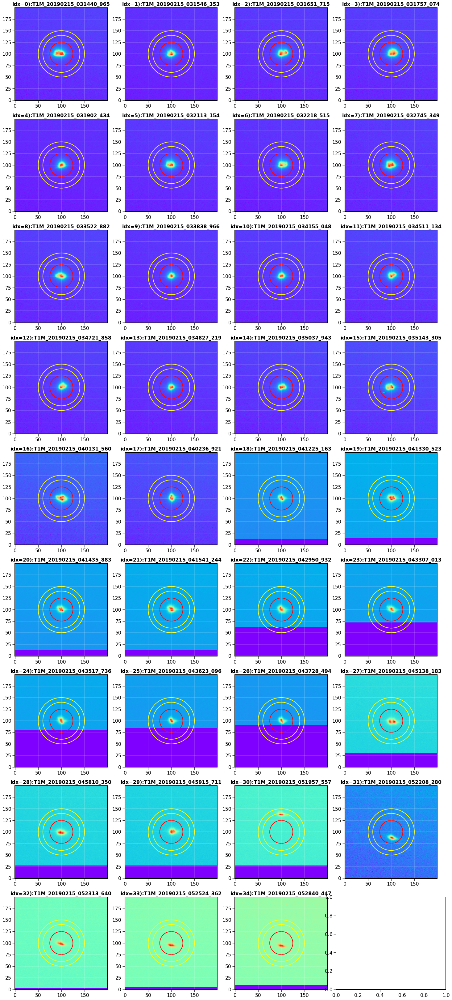

In [395]:
ShowAperture_SquareImage(new_vignettes,new_basenamecut,Selected_Indexes,X0,Y0,normflag=True,figfilename="all_aper_030719.png")

### The Compute the Sky Background in the annulus

In [396]:
theannulus_aperture = CircularAnnulus((X0,Y0), r_in=r_in_bkg, r_out=r_out_bkg)

In [397]:
theannulus_aperture.area()

2827.4333882308138

In [398]:
annulus_masks = theannulus_aperture.to_mask(method='center')

In [399]:
all_annulus_data= []
t_bkg = Table(names=('idx', 'N','Sfrac','mean','median','stddev'), dtype=('i4', 'i4','f4' ,'f4','f4','f4'))
count=0
for idx in Selected_Indexes: 
    
    annulus_data = annulus_masks[0].multiply(new_vignettes[count])
    mask = annulus_masks[0].data
    # a) mask all pixels that are not in annulus
    annulus_data_1d = annulus_data[mask > 0]
    # b) maks pixels that have exactly 0
    good_pixel_id=np.where(annulus_data_1d!=0)[0]
    selected_annulus_data_1d=annulus_data_1d[good_pixel_id] 
    # c) compute mean,median and sigma on non-zero pixel 
    N=len(np.where(selected_annulus_data_1d>0)[0])
    Sfrac=float(N)/theannulus_aperture.area()
    mean_sigclip, median_sigclip, stddev_sigclip = sigma_clipped_stats(selected_annulus_data_1d)
    # save
    all_annulus_data.append(annulus_data)
    t_bkg.add_row((idx,N,Sfrac,mean_sigclip, median_sigclip, stddev_sigclip))
    count+=1

In [400]:
t_bkg.show_in_notebook()

idx,N,Sfrac,mean,median,stddev
0,2812,0.9945415,831.54706,832.0424,40.148064
1,2812,0.9945415,846.83984,847.1674,40.79943
2,2812,0.9945415,854.7268,853.90466,43.347897
3,2812,0.9945415,869.8146,867.74396,44.11123
4,2812,0.9945415,884.0259,881.8266,44.57128
5,2812,0.9945415,921.4703,921.09503,46.35106
6,2812,0.9945415,941.80597,940.3972,50.034832
7,2812,0.9945415,840.3639,840.5559,38.12933
8,2812,0.9945415,1066.6072,1066.4023,49.63362
9,2812,0.9945415,1180.0537,1180.4401,53.688213


(0, 1.0)

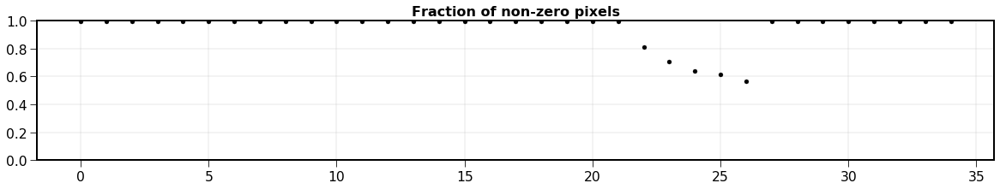

In [401]:
plt.figure(figsize=(20,3))
plt.plot(t_bkg["idx"],t_bkg["Sfrac"],'ok')
plt.grid()
plt.title("Fraction of non-zero pixels")
plt.ylim(0,1.0)

In [402]:
print(t_bkg["N"].max(),t_bkg["N"].min() )

2812 1598


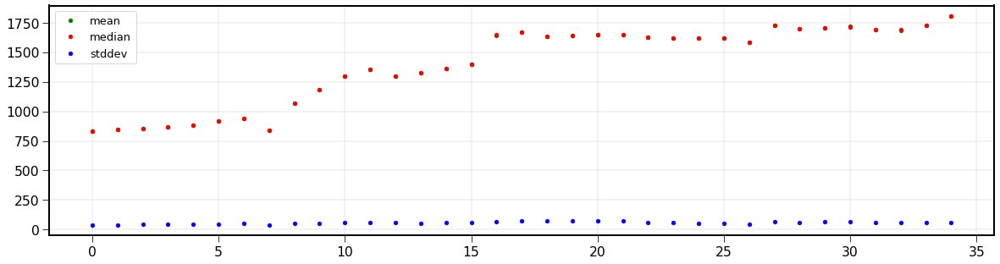

In [403]:
plt.figure(figsize=(20,5))
plt.plot(t_bkg["idx"],t_bkg["mean"],'og',label="mean")
plt.plot(t_bkg["idx"],t_bkg["median"],'or',label="median")
plt.plot(t_bkg["idx"],t_bkg["stddev"],'ob',label="stddev")
plt.legend()
plt.grid()

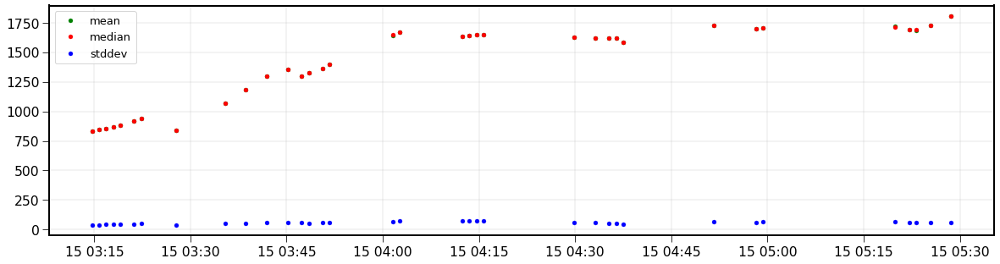

In [404]:
plt.figure(figsize=(20,5))
plt.plot(new_all_datetime,t_bkg["mean"],'og',label="mean")
plt.plot(new_all_datetime,t_bkg["median"],'or',label="median")
plt.plot(new_all_datetime,t_bkg["stddev"],'ob',label="stddev")
plt.legend()
plt.grid()

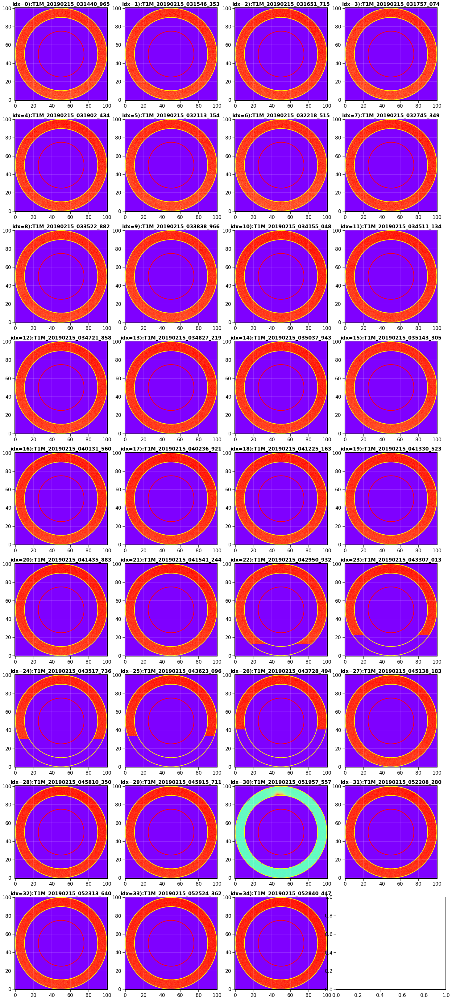

In [405]:
ShowAperture_SquareImage(all_annulus_data,new_basenamecut,Selected_Indexes,X0/2,Y0/2,normflag=True,figfilename="annulusbkg_030719.png")

### Background subtraction and residuals

In [406]:
count=0
all_bkgres=[]
all_bkgres_1d=[]
for annulus_data in all_annulus_data:
    median_sigclip=t_bkg["median"][count]
    fullbg = np.full_like(annulus_data, median_sigclip)
    bg=annulus_masks[0]*fullbg
    bkgres=np.where(annulus_data>0,annulus_data-bg,0)
    mask = annulus_masks[0].data
    bkgres_data_1d = bkgres[mask > 0]
    all_bkgres.append(bkgres)
    all_bkgres_1d.append(bkgres_data_1d)
    count+=1

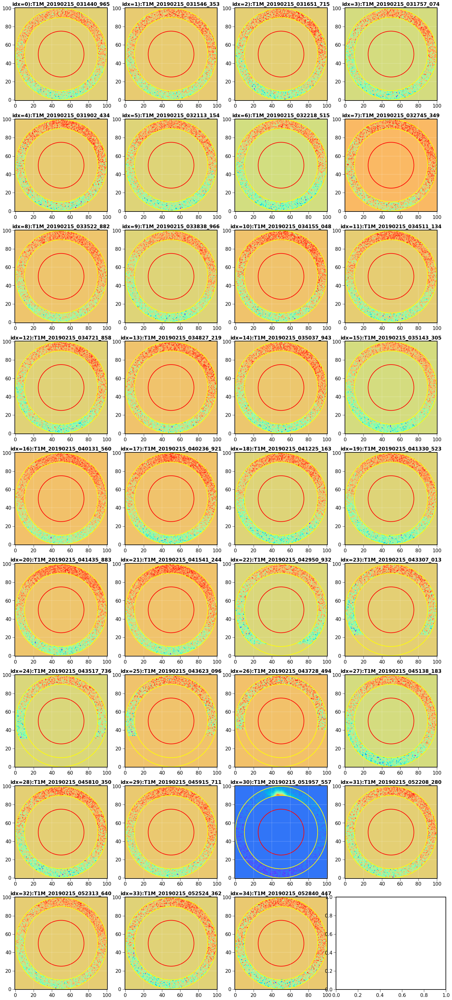

In [407]:
ShowAperture_SquareImage(all_bkgres,new_basenamecut,Selected_Indexes,X0/2,Y0/2,normflag=True,figfilename="annulusbkgres_030719.png")

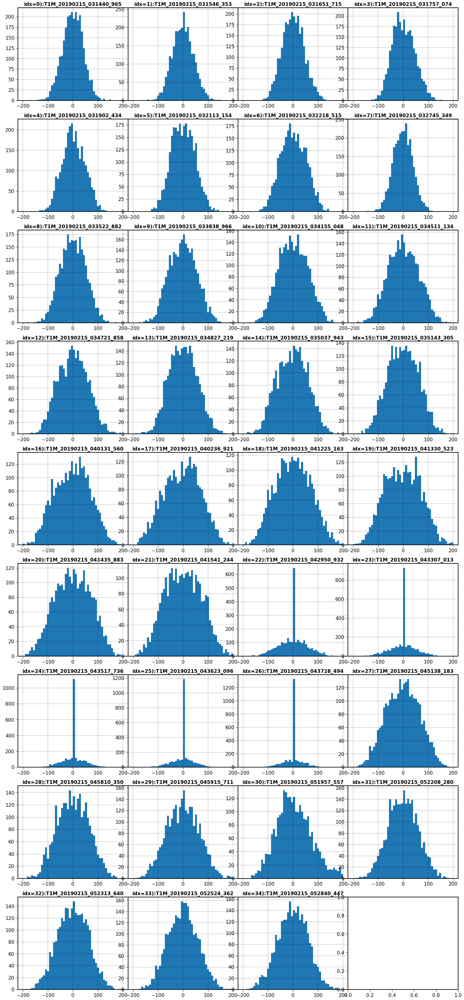

In [408]:
ShowHisto(all_bkgres_1d,new_basenamecut,Selected_Indexes,figfilename="annulusbkghist_030719.png")

## Circular Photometry and median sky background subtraction

In [409]:
star_aperture= CircularAperture((X0,Y0), r=r_star)

In [410]:
circular_masks = star_aperture.to_mask(method='center')

In [411]:
count=0
all_vignettes_subbkg=[]
for idx in Selected_Indexes: 
    thevignette=new_vignettes[count]
    starsignal=np.where(thevignette!=0,thevignette-t_bkg["median"][count],0)
    all_vignettes_subbkg.append(starsignal)
    count+=1

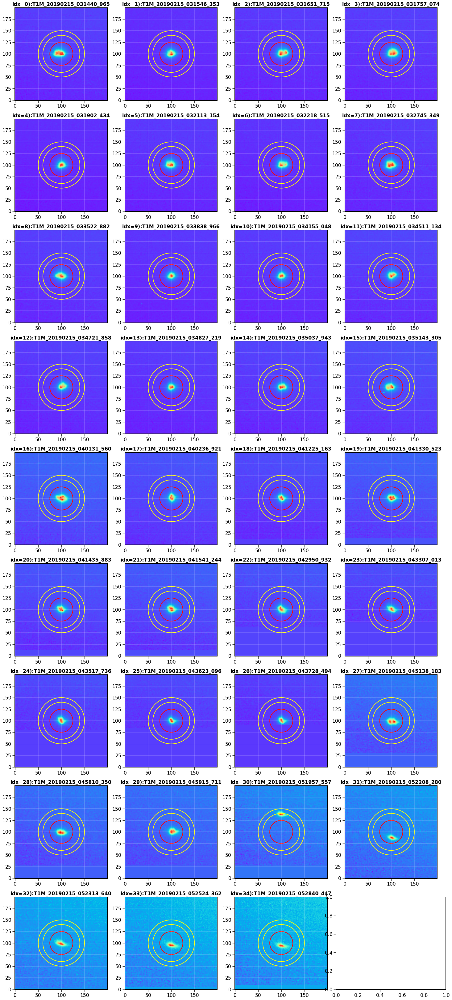

In [412]:
ShowAperture_SquareImage(all_vignettes_subbkg,new_basenamecut,Selected_Indexes,X0,Y0,normflag=True,figfilename="sigimgaper_030719.png")

### Circular photometry

In [413]:
count=0
all_circular_data= []
all_selected_circular_data_1d=[]
t_star = Table(names=('idx', 'N','Sfrac','sum','err1','err2'), dtype=('i4', 'i4','f4' ,'f4','f4','f4'))
for idx in Selected_Indexes: 
    
    circular_data = circular_masks[0].multiply(all_vignettes_subbkg[count])
    mask = circular_masks[0].data
    # a) mask all pixels that are not in annulus
    circular_data_1d = circular_data[mask > 0]
    # b) maks pixels that have exactly 0
    good_pixel_id=np.where(circular_data_1d!=0)[0]
    selected_circular_data_1d=circular_data_1d[good_pixel_id] 
    
    # c) compute mean,median and sigma on non-zero pixel 
    N=len(np.where(selected_circular_data_1d>0)[0])
    Sfrac=float(N)/star_aperture.area()
    # compute the flux sum
    phot_sum_adu=selected_circular_data_1d.sum()
    # compute the statistical fluctuation on the flux sum
    phot_sum_adu_err=np.sqrt(phot_sum_adu)/np.sqrt(gel)
    # statistical fluctuation on sky background subtraction
    #the good value
    #phot_averbkg_adu_err=t_bkg["stddev"][count]/np.sqrt(t_bkg["N"][count])*N
    
    phot_averbkg_adu_err=t_bkg["stddev"][count]*N
    
    t_star.add_row((idx,N,Sfrac,phot_sum_adu,phot_sum_adu_err,phot_averbkg_adu_err))
        
    all_circular_data.append(circular_data)
    all_selected_circular_data_1d.append(selected_circular_data_1d)
    count+=1

### Combine the errors

In [414]:
t_star["err_rel"]=np.sqrt((t_star["err1"]**2+t_star["err2"]**2))/t_star["sum"]

## Circular Aperture  

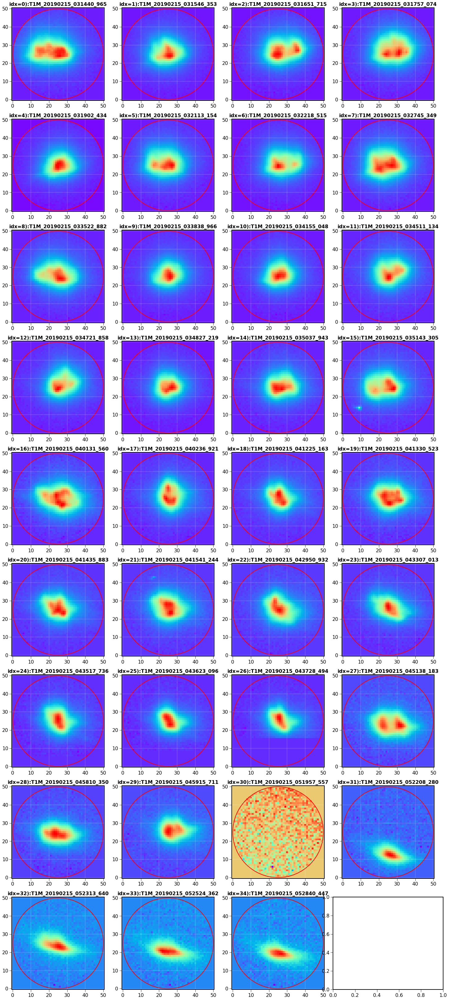

In [415]:
ShowAperture_SquareImage(all_circular_data,new_basenamecut,Selected_Indexes,X0/4,Y0/4,normflag=True,figfilename="sigcircaperture_030719.png")

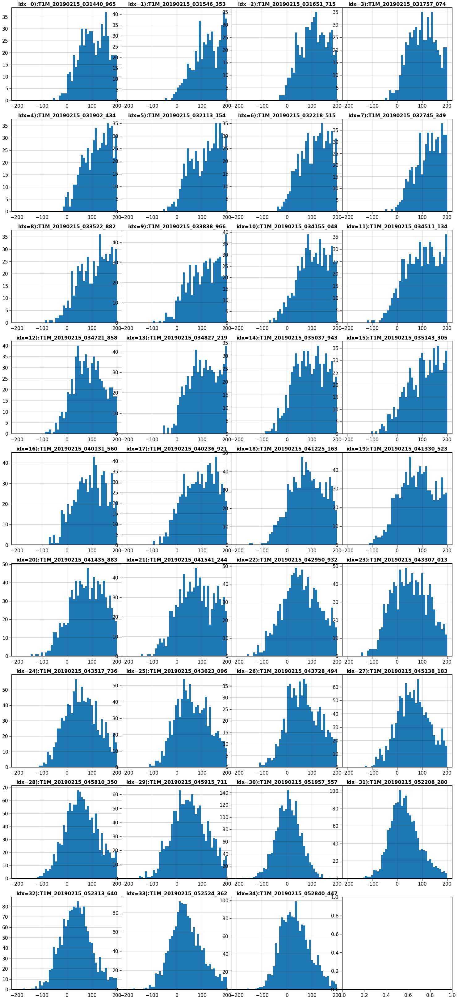

In [416]:
ShowHisto(all_selected_circular_data_1d,new_basenamecut,Selected_Indexes,figfilename="sigcircaperture_hist.png")

In [417]:
t_star.show_in_notebook()

idx,N,Sfrac,sum,err1,err2,err_rel
0,1929,0.98243165,5667652.5,1086.6282,77445.62,0.013665842
1,1932,0.9839595,5693562.5,1089.1091,78824.5,0.013845817
2,1929,0.98243165,5668627.5,1086.7217,83618.09,0.014752276
3,1926,0.98090374,5676717.0,1087.4968,84958.23,0.014967311
4,1933,0.9844688,5676069.5,1087.4348,86156.29,0.015180075
5,1927,0.98141307,5636381.0,1083.6263,89318.49,0.015847946
6,1927,0.98141307,5601300.0,1080.2488,96417.125,0.017214429
7,1937,0.986506,5724235.5,1092.039,73856.51,0.012903833
8,1915,0.9753015,5327291.5,1053.4954,95048.38,0.01784288
9,1911,0.97326434,5142100.5,1035.0222,102598.17,0.019953595


In [418]:
star_aperture.area()

1963.4954084936207

In [419]:
theannulus_aperture.area()

2827.4333882308138

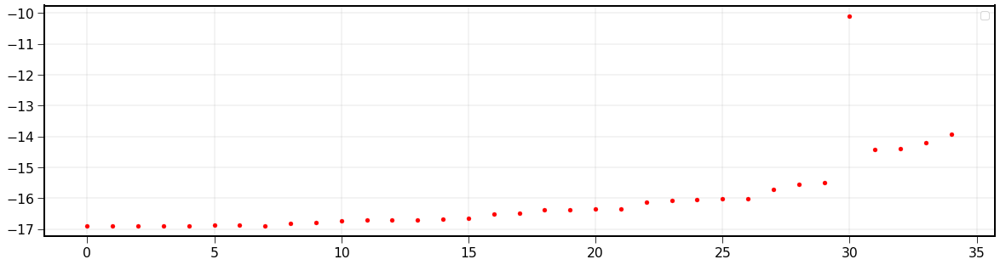

In [420]:
plt.figure(figsize=(20,5))
plt.plot(t_star["idx"],-2.5*np.log10(t_star["sum"]),'or')
plt.legend()
plt.grid()
#plt.ylim(-16.5,-15.5)

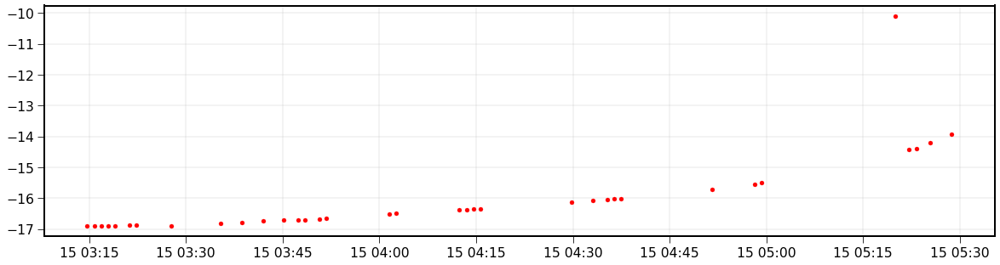

In [421]:
plt.figure(figsize=(20,5))
plt.plot(new_all_datetime,-2.5*np.log10(t_star["sum"]),'or')
plt.grid()
#plt.ylim(-16.5,-15.5)

## PSF and Seeing stuff

In [422]:
count=0
all_profX=[]
all_profY=[]
t_psf = Table(names=('idx','sigx','sigy'), dtype=('i4','f4','f4'))
for idx in Selected_Indexes:
    thevignette=all_vignettes_subbkg[count]
    theprofileX=thevignette.sum(axis=0)
    theprofileY=thevignette.sum(axis=1)
    average,sigmax=weighted_avg_and_std(np.arange(len(theprofileX)),theprofileX)
    average,sigmay=weighted_avg_and_std(np.arange(len(theprofileY)),theprofileY)
    t_psf.add_row((idx,sigmax,sigmay))
    all_profX.append(theprofileX)
    all_profY.append(theprofileY)
    count+=1

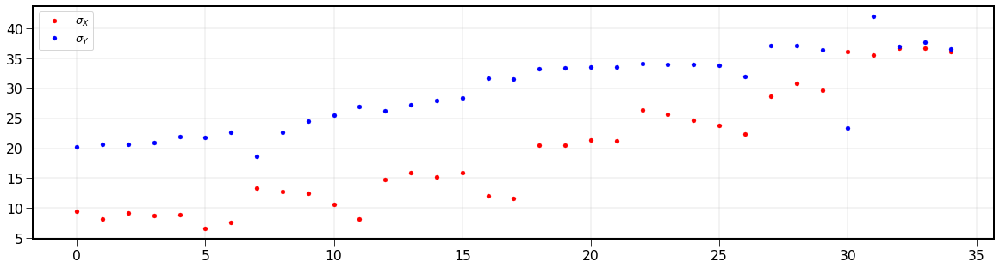

In [423]:
plt.figure(figsize=(20,5))
plt.plot(t_psf["idx"],t_psf["sigx"],'or',label="$\sigma_X$")
plt.plot(t_psf["idx"],t_psf["sigy"],'ob',label="$\sigma_Y$")
plt.legend()
plt.grid()

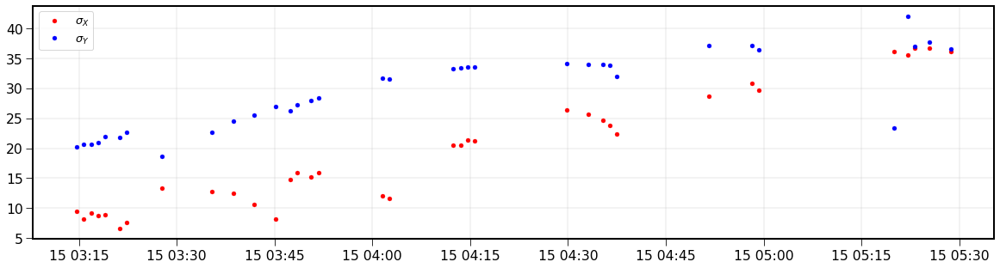

In [424]:
plt.figure(figsize=(20,5))
plt.plot(new_all_datetime,t_psf["sigx"],'or',label="$\sigma_X$")
plt.plot(new_all_datetime,t_psf["sigy"],'ob',label="$\sigma_Y$")
plt.legend()
plt.grid()

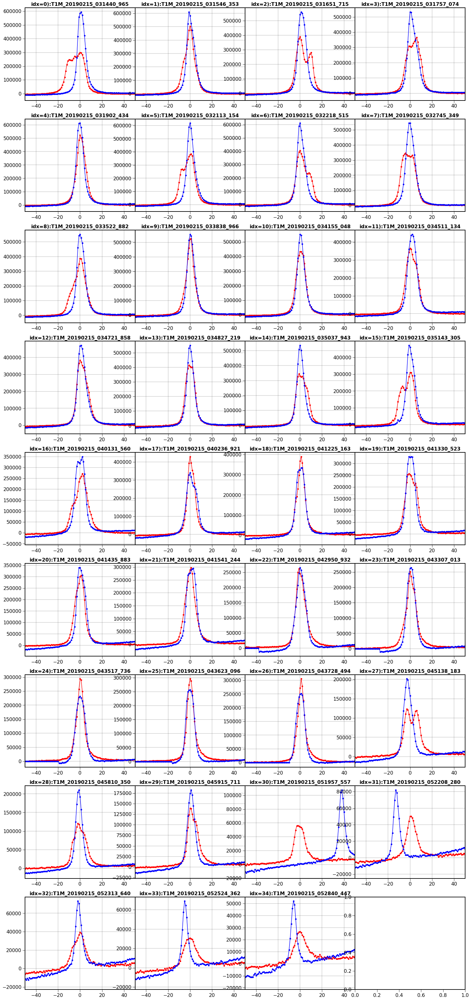

In [425]:
ShowProfile(all_profX,all_profY,new_basenamecut,Selected_Indexes,X0,Y0,figfilename="profiles_030719.png")

# Save table

In [426]:
new_t=astropy.table.join(t_star,t_psf,keys='idx')

In [427]:
new_t["bkg"]=t_bkg["median"]
new_t["stddev"]=t_bkg["stddev"]

In [438]:
new_t["airmass"]=new_airmass 
new_t["x0"]=all_x0
new_t["y0"]=all_y0
new_t["date"]=new_T
new_t["file"]=new_fn

In [429]:
new_t.remove_column("err_rel")

In [439]:
new_t[:5]

idx,Npixcirc,fracpixcirc,sigcirc,errstatcirc,errannul,sigx,sigy,bkgaverpix,bkgstddevpix,airmass,x0,y0,date,file
int32,int32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,object,str72
0,1929,0.9824,5.668e+06,1087,7.745e+04,9.47,20.25,832,40.15,1.004601969552878,991.1824539672208,118.81252919199967,2019-02-15T03:14:40.966,T1M_20190215_031440_965_HD116405-HOE200MM_Filtre_None_bin1x1.20_red.fit
1,1932,0.984,5.694e+06,1089,7.882e+04,8.225,20.61,847.2,40.8,1.004291928413923,1002.140663297516,120.37029858885748,2019-02-15T03:15:46.353,T1M_20190215_031546_353_HD116405-HOE200MM_Filtre_None_bin1x1.21_red.fit
2,1929,0.9824,5.669e+06,1087,8.362e+04,9.145,20.7,853.9,43.35,1.003994050996087,1013.0339946276961,123.85382767160813,2019-02-15T03:16:51.715,T1M_20190215_031651_715_HD116405-HOE200MM_Filtre_None_bin1x1.22_red.fit
3,1926,0.9809,5.677e+06,1087,8.496e+04,8.703,20.93,867.7,44.11,1.003708205696916,1030.8587301794228,125.94510204580033,2019-02-15T03:17:57.075,T1M_20190215_031757_074_HD116405-HOE200MM_Filtre_None_bin1x1.23_red.fit
4,1933,0.9845,5.676e+06,1087,8.616e+04,8.832,21.9,881.8,44.57,1.003434367193663,1048.861196838758,132.0121289858337,2019-02-15T03:19:02.435,T1M_20190215_031902_434_HD116405-HOE200MM_Filtre_None_bin1x1.24_red.fit


In [431]:
new_t.rename_column('N', 'Npixcirc')
new_t.rename_column('Sfrac', 'fracpixcirc')
new_t.rename_column('sum', 'sigcirc')
new_t.rename_column('err1','errstatcirc')
new_t.rename_column('err2','errannul')
new_t.rename_column('bkg','bkgaverpix')
new_t.rename_column('stddev','bkgstddevpix')


In [432]:
#new_t.colnames

In [433]:
for col in new_t.colnames:
    if col in ['fracpixcirc','sigcirc','errstatcirc','errannul','sigx','sigy','bkgaverpix','bkgstddevpix','airmass']:
        new_t[col].info.format = '%.4g'  # for consistent table output
        
new_t["x0"].info.format = '%3.0f'
new_t["y0"].info.format = '%3.0f'

In [434]:
new_t[:3]

idx,Npixcirc,fracpixcirc,sigcirc,errstatcirc,errannul,sigx,sigy,bkgaverpix,bkgstddevpix,airmass,x0,y0,date,file
int32,int32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float64,object,str72
0,1929,0.9824,5.668e+06,1087,7.745e+04,9.47,20.25,832,40.15,1.005,630,190,2019-02-15T03:14:40.966,T1M_20190215_031440_965_HD116405-HOE200MM_Filtre_None_bin1x1.20_red.fit
1,1932,0.984,5.694e+06,1089,7.882e+04,8.225,20.61,847.2,40.8,1.004,630,190,2019-02-15T03:15:46.353,T1M_20190215_031546_353_HD116405-HOE200MM_Filtre_None_bin1x1.21_red.fit
2,1929,0.9824,5.669e+06,1087,8.362e+04,9.145,20.7,853.9,43.35,1.004,630,190,2019-02-15T03:16:51.715,T1M_20190215_031651_715_HD116405-HOE200MM_Filtre_None_bin1x1.22_red.fit


In [435]:
new_t.write(fullfilenamestarphotometry,format="ascii.ecsv",overwrite=True)